# Waiting time predictability testing file

*created by Ricky Huang*

- running simulations based on real-world ECL protocol data

This file includes functions that reports **(mean) waiting time** and **(mean) outstanding time** for the simulations.
This file also outputs the graphs that illustrate the visual relations between **(mean) waiting time** and/or **(mean) outstanding time** vs. **Time**.

In [33]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import math
import sys
sys.path.append('../Utils/')
from Sim1_Util import roundhalf, plot_2Dy2
from Sim13_ecl_Init import initialize, sim_run
from Sim13_ecl_Batch import test_func, setup, single_run, get_mean, plot_multi_QueuesTime, plot_multi_WaitTime, test_batch_wpic
from Sim13_ecl_Util import get_random_data, data_to_csv, csv_to_jobs, res_to_csv, plot_scatter

%reload_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [7]:
'''gets data from csv'''
# path = 'ecldata/ecldata_without_re.csv'
# newpath = 'ecldata/ecldata_without_float.csv'
# data_to_csv(path,newpath)
# path = "ecldata/ecldata_without_float.csv"
# jobs, jobs_prob, mean_ot, total_ot, total_jobs = csv_to_jobs(path)
# path = "ecldata/ecldata_without_float.csv"
# jobs, jobs_prob, mean_ot, total_ot, total_jobs = csv_to_jobs(path)

'gets data from csv'

## Time_sequence collecting

In [30]:
def get_time_seq(cycle = 24, cycle_num = 300, eps = 0, cus_num = 1,
                 run = 10, prob = 0, poisson = True, var_op = True, 
                 wk_ratio = True, code = ''):

    #creates a csv recording wait_time and outstand_time and queue size
    path = "../ecldata/ecldata_without_float.csv"
    jobs, jobs_prob, mean_ot, total_ot, total_jobs = csv_to_jobs(path,mul=1)
    '''rounding up/down lambda acceptable?'''
    f_lam = roundhalf(total_jobs/cycle_num)
    f_rls = roundhalf(mean_ot/2)
    print('total jobs =',total_jobs)
    print(f'f_lam = {f_lam}, originally',total_jobs/cycle_num)
    print(f'f_rls time = {f_rls} hours')
    print(f'mean ot = {mean_ot} hours')
    
    scale = f_lam*cus_num

    if poisson:
        pois = 'pois'
    else:
        pois = 'nopois'
    if var_op:
        var = 'var'
    else:
        var = 'novar'
    new_path = f"time_dt/{code}_{scale}ecl_{pois}_{var}_P={prob}_{eps}eps_{run}runs.csv"

    contain = dict()
    contain['time_axis'] = np.arange(cycle*cycle_num)
    for i in range(run):
        if wk_ratio:
            waiting_times, outstanding_times, wk_ratios, ptcl_fin, ptcl_num, backlog_sz, thread_sz, ptcl_fincount, ptcl_stacount, op_stacount, q_limit = single_run(
                    x0 = 0, eps = eps, cus_num = cus_num, 
                    cycle = cycle, cycle_num = cycle_num,
                    pause_prob = prob, mean_ot = mean_ot, total = total_jobs,
                    jobs_data = jobs, jobs_prob = jobs_prob, sample_rm = False,
                    f_lam = f_lam, f_rls = f_rls, 
                    poisson = poisson, var_op = var_op, 
                    count = True, f_op = None, wk_ratio = wk_ratio)
            contain[f'wk_ratio {i}'] = np.array([x for (x,y) in wk_ratios])
        else:
            waiting_times, outstanding_times, ptcl_fin, ptcl_num, backlog_sz, thread_sz, ptcl_fincount, ptcl_stacount, op_stacount, q_limit = single_run(
                    x0 = 0, eps = eps, cus_num = cus_num, 
                    cycle = cycle, cycle_num = cycle_num,
                    pause_prob = prob, mean_ot = mean_ot, total = total_jobs,
                    jobs_data = jobs, jobs_prob = jobs_prob, sample_rm = False,
                    f_lam = f_lam, f_rls = f_rls, 
                    poisson = poisson, var_op = var_op, 
                    count = True, f_op = None)
            
        contain[f'outstand {i}'] = np.array([x for (x,y) in outstanding_times])
        szt = np.array([x for (x,y) in thread_sz])
        contain[f'meanoutstand {i}'] = [0]*(cycle*cycle_num)
        for j in range(cycle*cycle_num):
            if szt[j] > 0:
                contain[f'meanoutstand {i}'][j] = contain[f'outstand {i}'][j]/szt[j]
            else:
                contain[f'meanoutstand {i}'][j] = 0

        wait_time_tmp = np.zeros((cycle*cycle_num,2))
        mean_wait_time_tmp = [0]*(cycle*cycle_num)
        for (x,y) in waiting_times:
            wait_time_tmp[y,0] += x
            wait_time_tmp[y,1] += 1
        for (x,y) in waiting_times:
            mean_wait_time_tmp[y] = wait_time_tmp[y,0]/wait_time_tmp[y,1]
            
        contain[f'wait {i}'] = wait_time_tmp[:,0]
        contain[f'meanwait {i}'] = mean_wait_time_tmp
#         contain[f'queue {i}'] = [x for (x,y) in thread_sz][1:]
        assert(len(contain[f'wk_ratio {i}'])==len(contain['time_axis']))
        assert(len(contain[f'outstand {i}'])==len(contain['time_axis']))
        assert(len(contain[f'meanoutstand {i}'])==len(contain['time_axis']))
        assert(len(contain[f'wait {i}'])==len(contain['time_axis']))
        assert(len(contain[f'meanwait {i}'])==len(contain['time_axis']))
#         assert(len(contain[f'queue {i}'])==len(contain['time_axis']))


    df = pd.DataFrame(data = contain)
    df.to_csv(new_path)
    print('csv done')


In [31]:
get_time_seq(cycle = 24, cycle_num = 300, eps = 0.2, cus_num = 1,
             run = 20, prob = 0, poisson = True, var_op = True, 
             wk_ratio = True, code = 'new')

total jobs = 2915
f_lam = 10, originally 9.716666666666667
f_rls time = 8 hours
mean ot = 16.301200686106345 hours
op_num = 8.650600343053172
7200
op_num = 8.650600343053172
7200
op_num = 8.650600343053172
7200
op_num = 8.650600343053172
7200
op_num = 8.650600343053172
7200
op_num = 8.650600343053172
7200
op_num = 8.650600343053172
7200
op_num = 8.650600343053172
7200
op_num = 8.650600343053172
7200
op_num = 8.650600343053172
7200
op_num = 8.650600343053172
7200
op_num = 8.650600343053172
7200
op_num = 8.650600343053172
7200
op_num = 8.650600343053172
7200
op_num = 8.650600343053172
7200
op_num = 8.650600343053172
7200
op_num = 8.650600343053172
7200
op_num = 8.650600343053172
7200
op_num = 8.650600343053172
7200
op_num = 8.650600343053172
7200
csv done


## Plot data

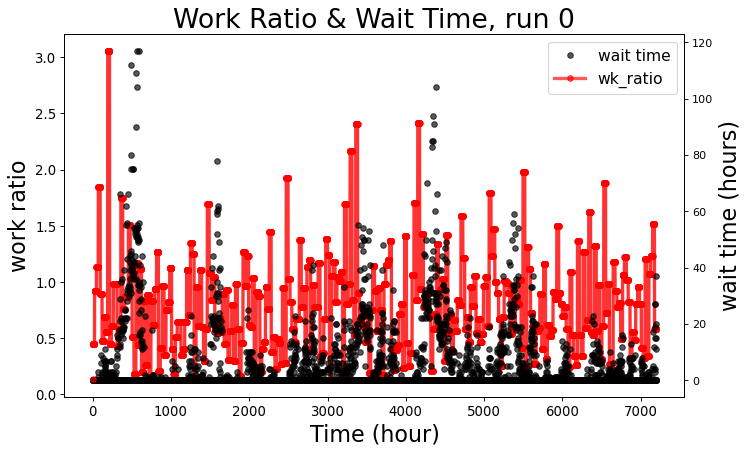

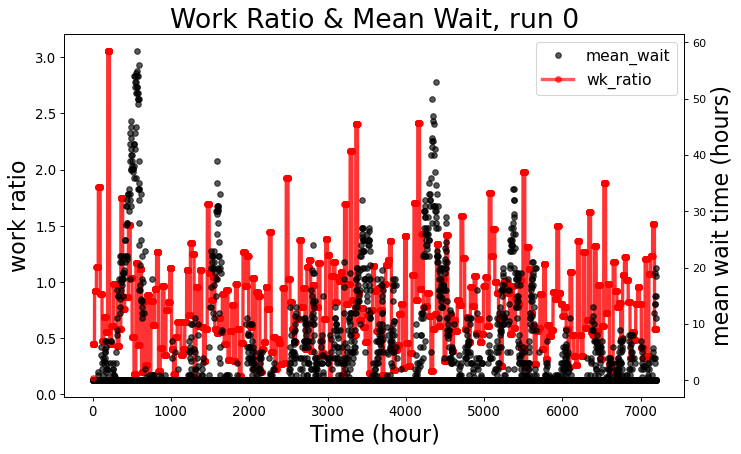

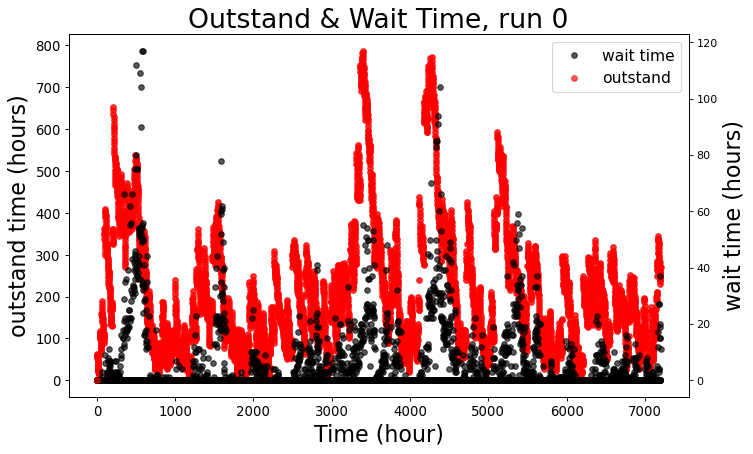

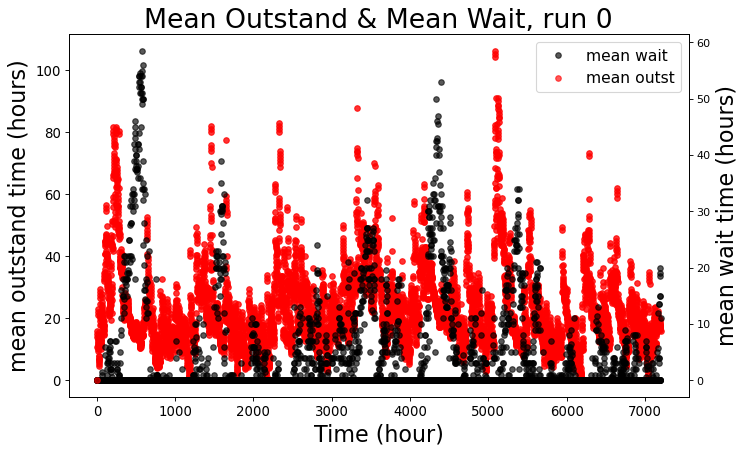

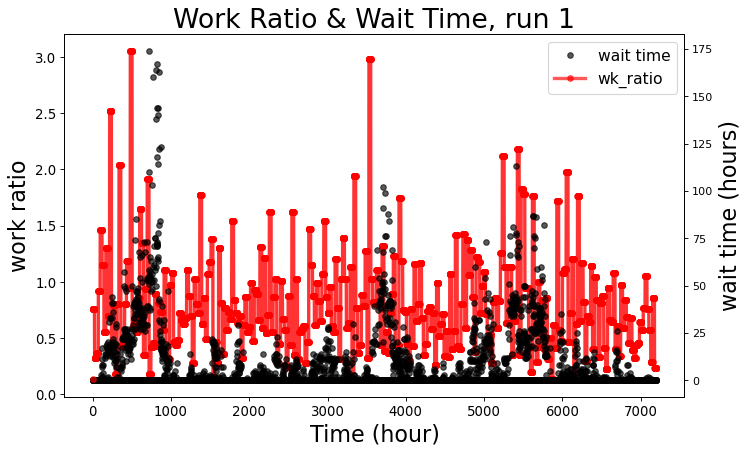

...

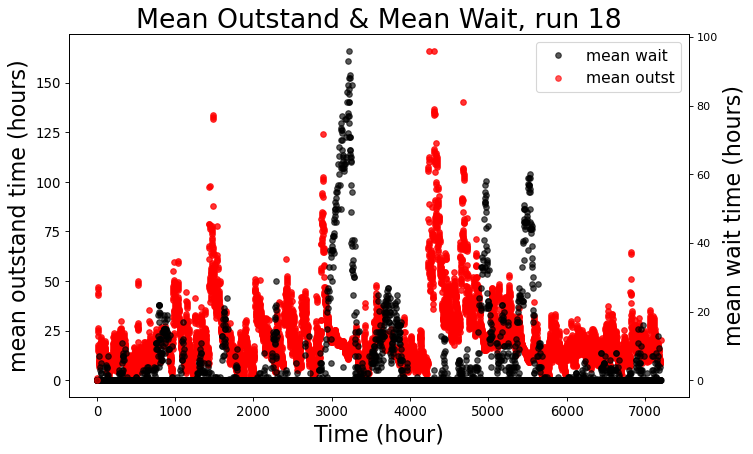

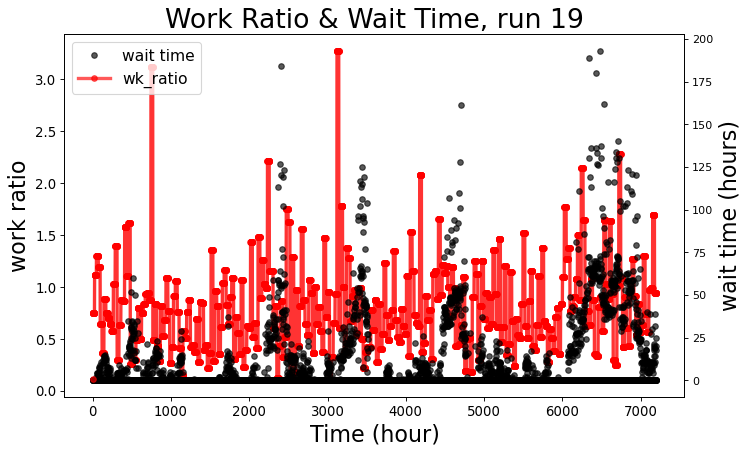

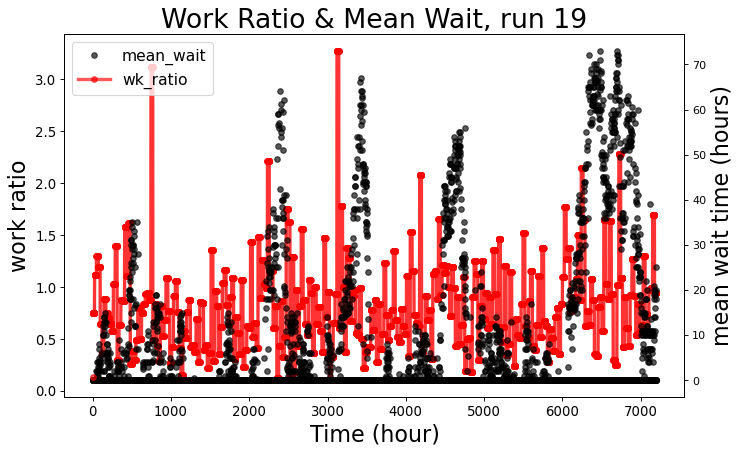

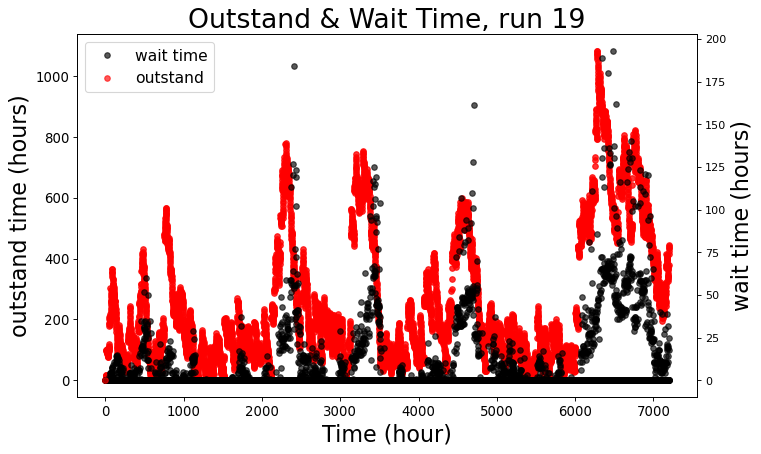

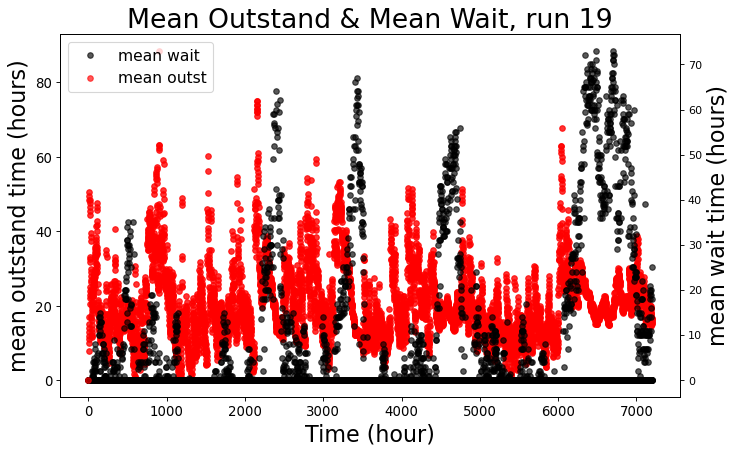

In [37]:
data_path = '../time_dt/new_10ecl_pois_var_P=0_0.2eps_20runs.csv'
data = pd.read_csv(data_path)
time_x = data['time_axis']
for i in range(20):
    wk_ratio = data[f'wk_ratio {i}']
    outstand = data[f'outstand {i}']
    wait = data[f'wait {i}']
    mean_outstand = data[f'meanoutstand {i}']
    mean_wait = data[f'meanwait {i}']
    
    data_info = [ [[time_x, wk_ratio],'ro-','wk_ratio'] ]
    data_info2 = [ [[time_x, wait],'ko','wait time'] ]
    title = f'Work Ratio & Wait Time, run {i}'
    input_label = 'Time (hour)'
    output_label = 'work ratio'
    output_label2 = 'wait time (hours)'
    plot_2Dy2(data_info,data_info2,title,
              input_label,output_label,output_label2,
              axis_bounds=None,xscale=None,yscale=None)
    
    data_info = [ [[time_x, wk_ratio],'ro-','wk_ratio'] ]
    data_info2 = [ [[time_x, mean_wait],'ko','mean_wait'] ]
    title = f'Work Ratio & Mean Wait, run {i}'
    input_label = 'Time (hour)'
    output_label = 'work ratio'
    output_label2 = 'mean wait time (hours)'
    plot_2Dy2(data_info,data_info2,title,
              input_label,output_label,output_label2,
              axis_bounds=None,xscale=None,yscale=None)
    
    data_info = [ [[time_x, outstand],'ro','outstand'] ]
    data_info2 = [ [[time_x, wait],'ko','wait time'] ]
    title = f'Outstand & Wait Time, run {i}'
    input_label = 'Time (hour)'
    output_label = 'outstand time (hours)'
    output_label2 = 'wait time (hours)'
    plot_2Dy2(data_info,data_info2,title,
              input_label,output_label,output_label2,
              axis_bounds=None,xscale=None,yscale=None)
    
    data_info = [ [[time_x, mean_outstand],'ro','mean outst'] ]
    data_info2 = [ [[time_x, mean_wait],'ko','mean wait'] ]
    title = f'Mean Outstand & Mean Wait, run {i}'
    input_label = 'Time (hour)'
    output_label = 'mean outstand time (hours)'
    output_label2 = 'mean wait time (hours)'
    plot_2Dy2(data_info,data_info2,title,
              input_label,output_label,output_label2,
              axis_bounds=None,xscale=None,yscale=None)
    
    